# Importing the Libraries

In [47]:
# linear algebra
import numpy as np

# data processing
import pandas as pd
# for retrieving files
import wget

# for visualization
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
from IPython.display import HTML
pio.templates.default = "plotly_dark"
%matplotlib inline

# Data Overview

In [48]:
#Download data

urls = ['https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv', 
        'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv',
       'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv']

for url in urls:
    filename = wget.download(url)

100% [..............................................................................] 56755 / 56755

In [49]:
conf_df = pd.read_csv('C:/Users/olani/Downloads/Documents/ML Portfolio/notebook/covid-19 notebook/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('C:/Users/olani/Downloads/Documents/ML Portfolio/notebook/covid-19 notebook/time_series_covid19_deaths_global.csv')
#recv_df = pd.read_csv('C:/Users/olani/Downloads/Documents/ML Portfolio/notebook/covid-19 notebook/time_series_covid19_recovered_global.csv')

In [50]:
# due to empty data in recovered dataset it won't be used
conf_df.tail()
#deaths_df.head()
#recv_df.tail()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20
259,Saint Pierre and Miquelon,France,46.885200,-56.315900,0,0,0,0,0,0,...,0,0,1,1,1,1,1,1,1,1
260,NaN,South Sudan,6.877000,31.307000,0,0,0,0,0,0,...,0,0,1,1,2,2,3,4,4,4
261,NaN,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,...,0,0,4,4,4,4,4,4,4,6
262,NaN,Sao Tome and Principe,0.186360,6.613081,0,0,0,0,0,0,...,0,0,0,4,4,4,4,4,4,4
263,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1


In [51]:
dates = conf_df.columns[4:].to_list()
conf_df_long = conf_df.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
                            value_vars=dates, var_name='Date', value_name='ConfirmedCases')

deaths_df_long = deaths_df.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
                            value_vars=dates, var_name='Date', value_name='Deaths')

#recv_df_long = recv_df.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
 #                            value_vars=dates, var_name='Date', value_name='Recovered')

df = pd.concat([conf_df_long, deaths_df_long['Deaths']], axis=1, sort=False)

df.head()

,Province/State,Country/Region,Lat,Long,Date,ConfirmedCases,Deaths
0,NaN,Afghanistan,33.0000,65.0000,1/22/20,0,0
1,NaN,Albania,41.1533,20.1683,1/22/20,0,0
2,NaN,Algeria,28.0339,1.6596,1/22/20,0,0
3,NaN,Andorra,42.5063,1.5218,1/22/20,0,0
4,NaN,Angola,-11.2027,17.8739,1/22/20,0,0


In [52]:
# no of empyty data
df.isnull().sum()

Province/State    14924
Country/Region        0
Lat                   0
Long                  0
Date                  0
ConfirmedCases        0
Deaths                0
dtype: int64

# Exploratory Data Analysis

In [53]:
# working on the date variable
df.Date = df.Date.astype('datetime64[ns]')
df.Date = [time.date() for time in df.Date]

In [54]:
# no of affected country
affected_country = df['Country/Region'].nunique()
earliest_date = f"{df['Date'].min()}"
last_date = f"{df['Date'].max()}"
print('There are {a} number of affected country within {b} and {c}'.format(a=affected_country,b=earliest_date,c=last_date))

There are 185 number of affected country within 2020-01-22 and 2020-04-12


In [57]:
# no of affected countries in Africa as at 2020-04-06
africa = list(['Nigeria','Ethiopia','Egypt','Republic of the Congo','Tanzania','South Africa','Kenya','Uganda','Algeria','Sudan','Morocco',
'Angola','Mozambique','Ghana','Madagascar','Cameroon','Cote d\'Ivoire','Niger','Burkina Faso','Mali','Malawi','Zambia','Senegal','Chad','Somalia','Zimbabwe','Guinea','Rwanda','Benin',
               'Burundi','Tunisia','South Sudan','Togo','Sierra Leone','Libya','Congo (Brazzaville)','Congo (Kinshasa)','Liberia','Central African Republic','Mauritania','Eritrea',
'Namibia','Gambia','Botswana','Gabon','Guinea-Bissau','Equatorial Guinea','Mauritius','Eswatini','Djibouti','Cabo Verde','Sao Tome and Principe','Seychelles','Western Sahara'])
df_africa = df[df['Country/Region'].isin(africa)]
# no of affected country
af_c = df_africa['Country/Region'].nunique()
earliest_date = f"{df_africa['Date'].min()}"
last_date = f"{df_africa['Date'].max()}"
print('There are {a} numbers of affected African countries within {b} and {c}'.format(a=af_c,b=earliest_date,c=last_date))

There are 53 numbers of affected African countries within 2020-01-22 and 2020-04-12


In [58]:
# Map of all countries affected by the virus as at 11/04/2020.
current_af = df.loc[df.Date == df.Date.max()]
cc = current_af.drop('Province/State',axis=1)
current = cc[cc['Date'] == max(cc['Date'])].reset_index()
current_case = current.groupby('Country/Region')['ConfirmedCases','Deaths'].sum().reset_index()

fig = px.choropleth(current_case, locations="Country/Region", 
                    locationmode='country names', color="ConfirmedCases", 
                    hover_name="Country/Region", range_color=[1,5000], 
                    color_continuous_scale="peach", 
                    title='The World Confirmed Cases caused by Covid19')
# fig.update(layout_coloraxis_showscale=False)
fig.show()

In [59]:
# Geographical map of death cases globally.
#fig = px.choropleth(current_case, locations="Country_Region", 
#                    locationmode='country names', color="Fatalities", 
#                    hover_name="Country_Region", range_color=[1,5000], 
 #                   color_continuous_scale="peach", 
 #                   title='The World Death Cases caused by Covid19')
# fig.update(layout_coloraxis_showscale=False)
#fig.show()

In [60]:
# Geographical map of confirmed cases in Africa.
af_grouped = df_africa.loc[df_africa.Date == df_africa.Date.max()].groupby('Country/Region')['ConfirmedCases','Deaths'].sum().reset_index()
fig = px.choropleth(af_grouped, locations="Country/Region", 
                    locationmode='country names', color="ConfirmedCases", 
                    hover_name="Country/Region", range_color=[1,5000], 
                    color_continuous_scale="peach", 
                    title='African Countries with Confirmed Cases', scope='africa', height=800)
# fig.update(layout_coloraxis_showscale=False)
fig.show()

In [61]:
# confirmed cases in Africa
df_con = df_africa.drop(['Deaths'],axis=1)
df_con['Province_State'] = 'Africa'

group_lk = df_con.set_index('Country/Region')['Province_State'].to_dict()

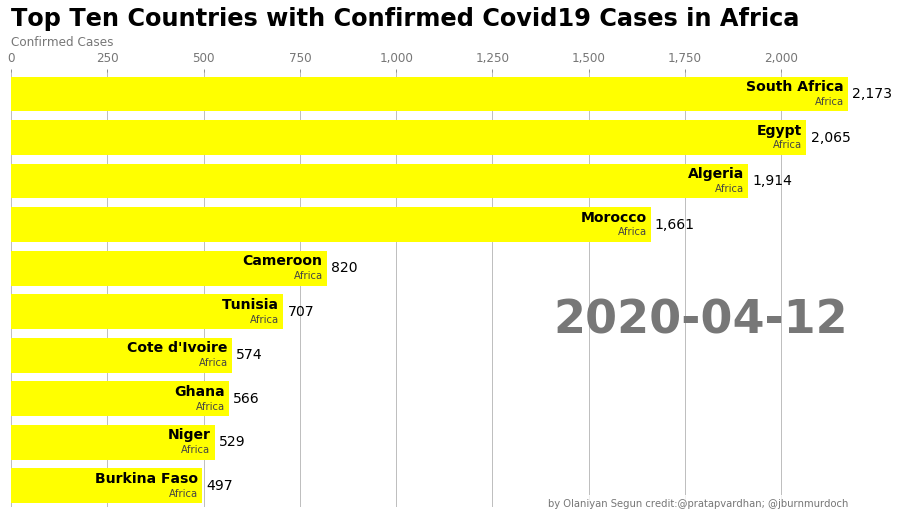

In [62]:
# functions to make the animation (for confirmed case)
"""""
fig, ax = plt.subplots(figsize=(15, 8))

def draw_barchart(current_year):
    dff = df_con[df_con['Date'].eq(current_year)].sort_values(by='ConfirmedCases', ascending=True).tail(10)
    ax.clear()
    ax.barh(dff['Country/Region'], dff['ConfirmedCases'], color='yellow')
    dx = dff['ConfirmedCases'].max() / 200
    for i, (value, name) in enumerate(zip(dff['ConfirmedCases'], dff['Country/Region'])):
        ax.text(value-dx, i,     name,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value-dx, i-.25, group_lk[name], size=10, color='#444444', ha='right', va='baseline')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    ax.text(1, 0.4, current_year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Confirmed Cases', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.15, 'Top Ten Countries with Confirmed Covid19 Cases in Africa',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    ax.text(1, 0, 'by Olaniyan Segun credit:@pratapvardhan; @jburnmurdoch', transform=ax.transAxes, color='#777777', ha='right',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
draw_barchart(df_africa.Date.max())

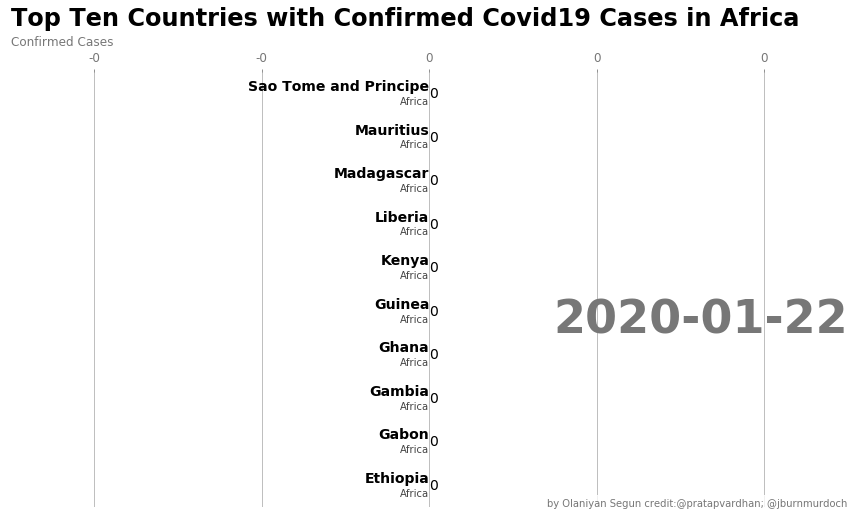

In [63]:
# code for the animation (for death case)
"""""
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart,frames=df_con.Date.unique().tolist())
HTML(animator.to_jshtml())
# or use animator.to_html5_video() or animator.save()

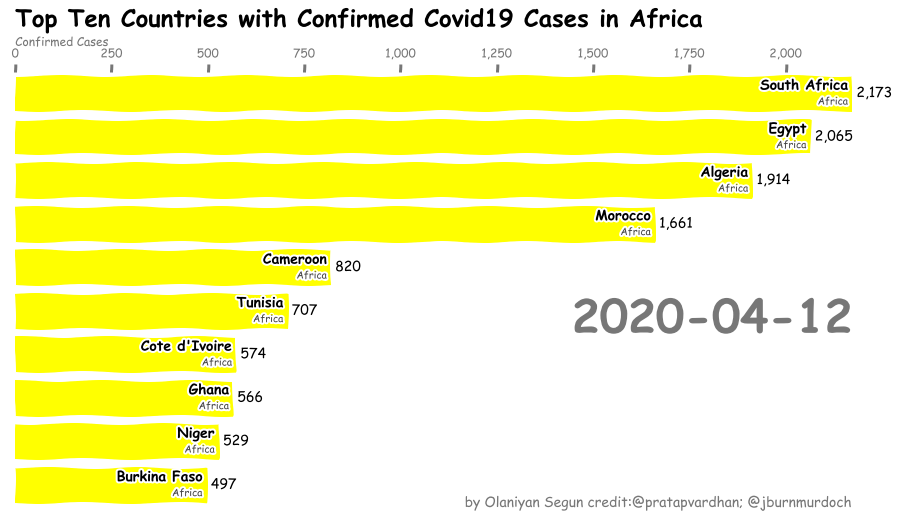

In [64]:
with plt.xkcd():
    fig, ax = plt.subplots(figsize=(15, 8))
    draw_barchart(df_africa.Date.max())

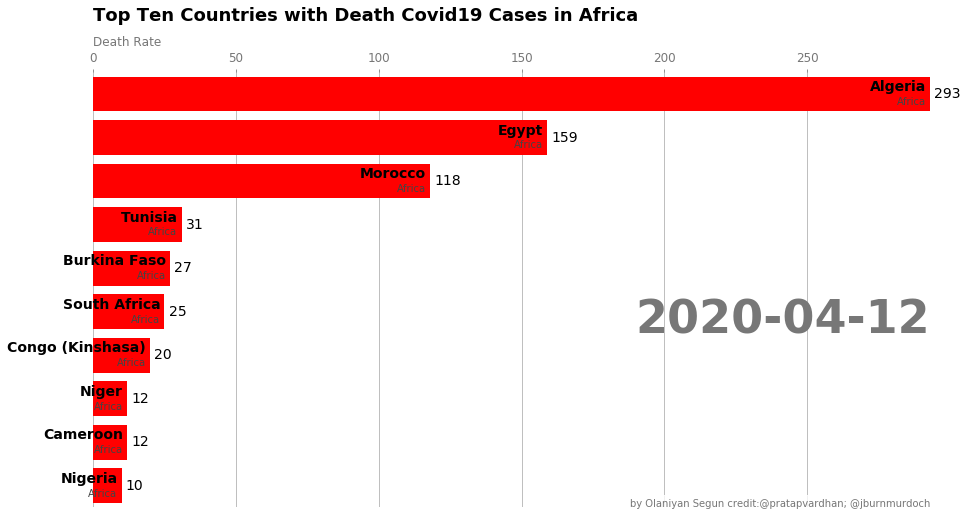

In [65]:
# functions to make the animation (for death case)
""""
df_dt = df_africa.drop(['ConfirmedCases'],axis=1)
fig, ax = plt.subplots(figsize=(15, 8))

def draw_barchart(current_year):
    dff = df_dt[df_dt['Date'].eq(current_year)].sort_values(by='Deaths', ascending=True).tail(10)
    ax.clear()
    ax.barh(dff['Country/Region'], dff['Deaths'],color='red')
    dx = dff['Deaths'].max() / 200
    for i, (value, name) in enumerate(zip(dff['Deaths'], dff['Country/Region'])):
        # country
        ax.text(value-dx, i,     name,           size=14, weight=600, ha='right', va='bottom')
        # Province
        ax.text(value-dx, i-.25, group_lk[name], size=10, color='#444444', ha='right', va='baseline')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    ax.text(1, 0.4, current_year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Death Rate', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.15, 'Top Ten Countries with Death Covid19 Cases in Africa',
            transform=ax.transAxes, size=18, weight=600, ha='left', va='top')
    ax.text(1, 0, 'by Olaniyan Segun credit:@pratapvardhan; @jburnmurdoch', transform=ax.transAxes, color='#777777', ha='right',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
draw_barchart(df_africa.Date.max())

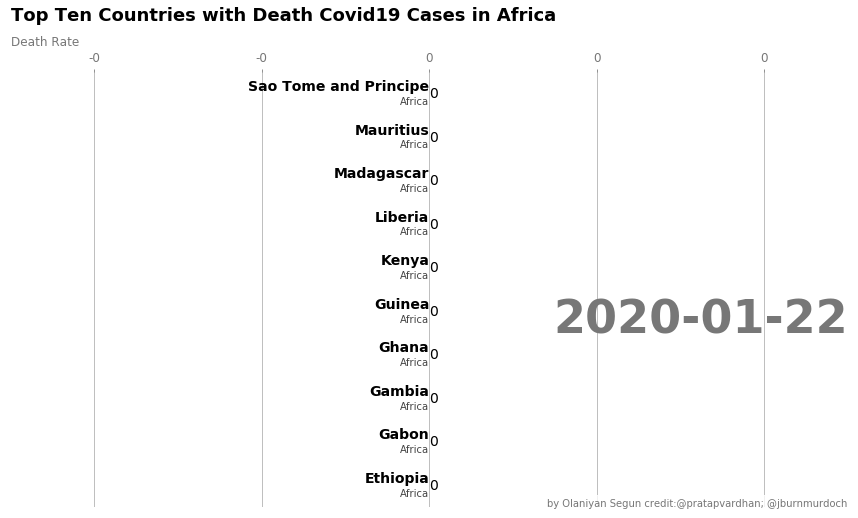

In [66]:
# code for the animation (for death case)
""""
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart,frames=df_dt.Date.unique().tolist())
HTML(animator.to_jshtml())
# or use animator.to_html5_video() or animator.save()

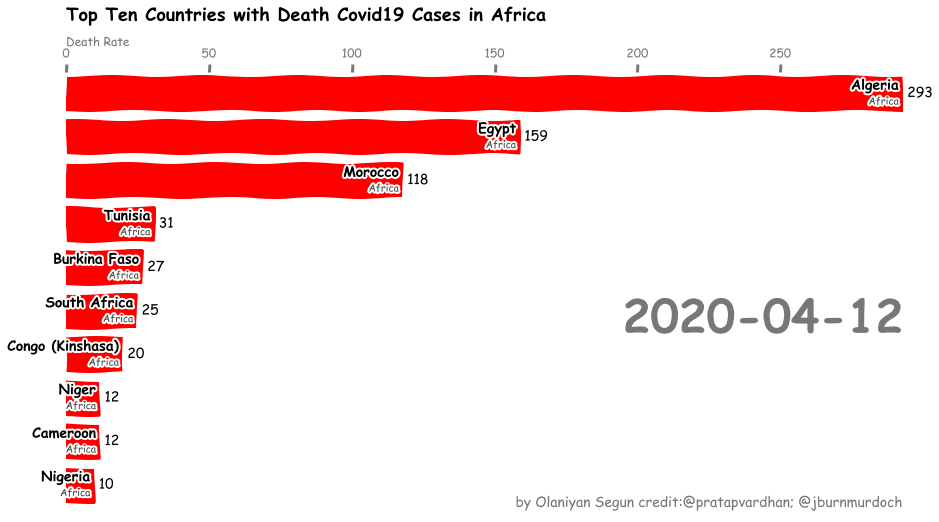

In [67]:
with plt.xkcd():
    fig, ax = plt.subplots(figsize=(15, 8))
    draw_barchart(df_africa.Date.max())
# color to red for countries and province

In [68]:
# _wdt is without date
#grouped_africa_wdt = df_africa.groupby('Country/Region')['ConfirmedCases', 'Deaths'].max().reset_index()

#grouped_africa_wdt.sort_values('Deaths', ascending=False)[['Country/Region', 'Deaths']][:20].style.background_gradient(cmap='Reds')

In [69]:
# Confirmed case of South Africa
sa = df_africa.loc[df_africa['Country/Region'] == 'South Africa']
sa = sa[sa.Date.isin(sa.Date.to_list()[16:])]
sa_group = sa.groupby('Date')['ConfirmedCases'].sum().reset_index()
#sa_group.tail()
fig = px.line(sa_group,x='Date',y='ConfirmedCases',title='Confirmed Cases of South Africa Overtime',
              color_discrete_sequence=['yellow'])
fig.show()

fig = px.area(sa_group,x='Date',y='ConfirmedCases',title='Confirmed Cases of South Africa Overtime',
              color_discrete_sequence=['yellow'])
fig.show()

In [70]:
# Death case of Algeria
al = df_africa.loc[df_africa['Country/Region'] == 'Algeria']
al_group = al.groupby('Date')['Deaths'].sum().reset_index()
#al_group.tail()
fig = px.line(al_group,x='Date',y='Deaths',title='Death Cases of Algeria Overtime',
              color_discrete_sequence=['red'])
fig.show()

fig = px.area(al_group,x='Date',y='Deaths',title='Death Cases of Algeria Overtime',
              color_discrete_sequence=['red'])
fig.show()

In [71]:
# comparing the death and confirmed cases in Africa
com_df = df_africa.groupby('Date')['ConfirmedCases', 'Deaths'].sum().reset_index()
com_df = com_df.melt(id_vars="Date", value_vars=['ConfirmedCases', 'Deaths'],
                 var_name='Case', value_name='Total Case')


fig = px.line(com_df, x="Date", y="Total Case", color='Case',
             title='Confirmed and Death Cases in Africa over time', color_discrete_sequence = ['yellow', 'red'])
fig.show()

In [72]:
# create death_spread variable
death_spread = df.groupby(['Date', 'Country/Region'])['ConfirmedCases', 'Deaths'].max()
death_spread = death_spread.reset_index()
death_spread['Date'] = pd.to_datetime(death_spread['Date'])
death_spread['Date'] = death_spread['Date'].dt.strftime('%m/%d/%Y')
death_spread['ConfirmedCases'] = death_spread['ConfirmedCases'].astype('float64')
death_spread['Deaths'] = death_spread['Deaths'].astype('float64')
death_spread['Size'] = death_spread['Deaths'].pow(0.3)
fig = px.scatter_geo(death_spread, locations="Country/Region", locationmode='country names', color="Deaths", size='Size', hover_name="Country/Region", range_color= [0, 100], projection="natural earth", animation_frame="Date", title='COVID-19: Deaths Spread Over Time  Globally (2020–01–22 to 2020–04–11)', color_continuous_scale="peach")
fig.show()

In [73]:
# if you want to code the animation you can remove the quotation mark above the code or copy the link here
# to generate the dataset for the animation of the link below
#
# dataset generation for confirmed cases in africa 
conf_df_africa=conf_df[conf_df['Country/Region'].isin(africa)]
conf_df_africa = conf_df_africa.drop(['Province/State','Lat','Long'],axis=1)
conf_df_africa.to_csv('africa_confirmed_cases.csv',index=False)

# dataset generation for death cases in africa 
deaths_df_africa=deaths_df[deaths_df['Country/Region'].isin(africa)]
deaths_df_africa = deaths_df_africa.drop(['Province/State','Lat','Long'],axis=1)
deaths_df_africa.to_csv('africa_deaths_cases.csv',index=False)


In [74]:
# if you want the code for the animation you can remove the triple quote in the animation code above or click the link below
#https://public.flourish.studio/visualisation/1894894/
#https://public.flourish.studio/visualisation/1910906/